# Machine Learning and Public Policy:   Diagnostic

### March 29th, 2017

J. Adrian Sanchez Castro

# Problem 1: Data Acquisition and Analysis

In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

import seaborn as sns
sns.set(color_codes=True)

import plotly
import plotly.graph_objs as py
plotly.offline.init_notebook_mode()

import glob
import os
import gmaps

import calmap
import warnings
warnings.simplefilter('ignore')

## Datafiles download in bach manually and added in a directory: data
### Checkout data files

In [3]:
!cd data && pwd && ls -1

/Users/schzcas/Documents/github/machine-learning-public-policy/diagnostic/data
graffiti.csv
pothole.csv
sanitation.csv
vacant.csv


### Pandas data frame importation

In [18]:
graffiti = pd.read_csv('/Users/schzcas/Documents/github/machine-learning-public-policy/diagnostic/data/graffiti.csv')
pothole = pd.read_csv('/Users/schzcas/Documents/github/machine-learning-public-policy/diagnostic/data/pothole.csv')
sanitation = pd.read_csv('/Users/schzcas/Documents/github/machine-learning-public-policy/diagnostic/data/sanitation.csv')
vacant = pd.read_csv('/Users/schzcas/Documents/github/machine-learning-public-policy/diagnostic/data/vacant.csv')

# GRAFFITI dataset

## Checkout very quickly columns and data before importation

In [19]:
!cd data && head -n 2 graffiti.csv

Creation Date,Status,Completion Date,Service Request Number,Type of Service Request,What Type of Surface is the Graffiti on?,Where is the Graffiti located?,Street Address,ZIP Code,X Coordinate,Y Coordinate,Ward,Police District,Community Area,SSA,Latitude,Longitude,Location
03/30/2016,Completed,03/30/2016,16-02134145,Graffiti Removal,Glass,Front,531 N CLARK ST,60654,1175441.77867511,1903914.93022029,42,18,8,,41.89170969838417,-87.63098218718851,"(41.89170969838417, -87.63098218718851)"


## Shape of the dataframe

In [20]:
graffiti.shape

(117036, 18)

In [21]:
print("# of Rows:", graffiti.shape[0])

# of Rows: 117036


In [22]:
graffiti.shape[0]

117036

## Let's throw out na's

In [23]:
graffiti = graffiti.dropna(subset =['Latitude'])

In [24]:
graffiti = graffiti.dropna(subset=['Longitude'])

In [25]:
graffiti.shape

(116961, 18)

## Checkout types of columns

In [26]:
graffiti.dtypes

Creation Date                                object
Status                                       object
Completion Date                              object
Service Request Number                       object
Type of Service Request                      object
What Type of Surface is the Graffiti on?     object
Where is the Graffiti located?               object
Street Address                               object
ZIP Code                                    float64
X Coordinate                                float64
Y Coordinate                                float64
Ward                                        float64
Police District                             float64
Community Area                              float64
SSA                                         float64
Latitude                                    float64
Longitude                                   float64
Location                                     object
dtype: object

## Let's create a new column of Location of type Tuple, we will need shortly

In [27]:
graffiti['location-tuple'] = list(zip(graffiti.Latitude, graffiti.Longitude))

## Change  values and type of columns

In [28]:
float64= graffiti.dtypes[graffiti.dtypes == "float64"].index
for i in float64:
    graffiti[i] = graffiti[i].astype(str)

new_zip = np.array([zipcode[0:5] for zipcode in graffiti['ZIP Code']])
graffiti['ZIP Code'] = new_zip

object_type= graffiti.dtypes[graffiti.dtypes == "object"].index
for i in object_type:
    graffiti[i] = graffiti[i].astype("category")    
    
graffiti.dtypes

Creation Date                               category
Status                                      category
Completion Date                             category
Service Request Number                      category
Type of Service Request                     category
What Type of Surface is the Graffiti on?    category
Where is the Graffiti located?              category
Street Address                              category
ZIP Code                                    category
X Coordinate                                category
Y Coordinate                                category
Ward                                        category
Police District                             category
Community Area                              category
SSA                                         category
Latitude                                    category
Longitude                                   category
Location                                    category
location-tuple                              ca

## Check head and tail of dataframe

Let's look at the "Creation date" column to see the time of our data: 1 year

In [12]:
graffiti.head(1)

,Creation Date,Status,Completion Date,Service Request Number,Type of Service Request,What Type of Surface is the Graffiti on?,Where is the Graffiti located?,Street Address,ZIP Code,X Coordinate,Y Coordinate,Ward,Police District,Community Area,SSA,Latitude,Longitude,Location,location-tuple
0,03/30/2016,Completed,03/30/2016,16-02134145,Graffiti Removal,Glass,Front,531 N CLARK ST,60654,1175441.77868,1903914.93022,42.0,18.0,8.0,nan,41.8917096984,-87.6309821872,"(41.89170969838417, -87.63098218718851)","(41.8917096984, -87.6309821872)"


In [13]:
graffiti.tail(1)

,Creation Date,Status,Completion Date,Service Request Number,Type of Service Request,What Type of Surface is the Graffiti on?,Where is the Graffiti located?,Street Address,ZIP Code,X Coordinate,Y Coordinate,Ward,Police District,Community Area,SSA,Latitude,Longitude,Location,location-tuple
117035,03/28/2017,Completed,03/28/2017,17-01734488,Graffiti Removal,Brick - Painted,Front,5738 N WINTHROP AVE,60660,1167828.63953,1938278.7743,48.0,20.0,77.0,26.0,41.9866474265,-87.6582573976,"(41.98664742652018, -87.65825739764902)","(41.9866474265, -87.6582573976)"


## Let's delete columns we are not going to use in this EDA

In [14]:
columns_to_erase = ['Service Request Number','X Coordinate', 'Y Coordinate','Ward','Police District','Community Area','SSA','Latitude','Longitude','Location']

for i in columns_to_erase:
    del graffiti[i]  # delete columns

graffiti.head(1)

,Creation Date,Status,Completion Date,Type of Service Request,What Type of Surface is the Graffiti on?,Where is the Graffiti located?,Street Address,ZIP Code,location-tuple
0,03/30/2016,Completed,03/30/2016,Graffiti Removal,Glass,Front,531 N CLARK ST,60654,"(41.8917096984, -87.6309821872)"


## Let's have a look at a quick description of categorical variables


In [17]:
categorical = graffiti.dtypes[graffiti.dtypes == "category"].index
graffiti[categorical].describe()

ValueError: Cannot describe a DataFrame without columns

## We can see some unique values for some columns

In [16]:
graffiti['What Type of Surface is the Graffiti on?'].unique()

[Glass, Wood - Unpainted, Brick - Unpainted, Brick - Painted, Wood - Painted, ..., Aluminum Siding, Limestone, Other/Unknown Surface, Asphalt, Tree]
Length: 18
Categories (17, object): [Glass, Wood - Unpainted, Brick - Unpainted, Brick - Painted, ..., Limestone, Other/Unknown Surface, Asphalt, Tree]

In [17]:
graffiti['Where is the Graffiti located?'].unique()

[Front, Side, Fence, Garage, Pole, ..., Dumpster, Express Way Job, Overpass, Hydrant, Phone]
Length: 21
Categories (20, object): [Front, Side, Fence, Garage, ..., Express Way Job, Overpass, Hydrant, Phone]

## Let's see where are zipcodes that most of our Graffiti Calls are from

In [18]:
histo_graffiti = graffiti['ZIP Code'].value_counts()
histo_graffiti.iloc[:10]

60632    13058
60618    10103
60647     9928
60608     8362
60629     7080
60625     6343
60622     6260
60609     4591
60623     4567
60639     4181
Name: ZIP Code, dtype: int64

## Plot this distribution

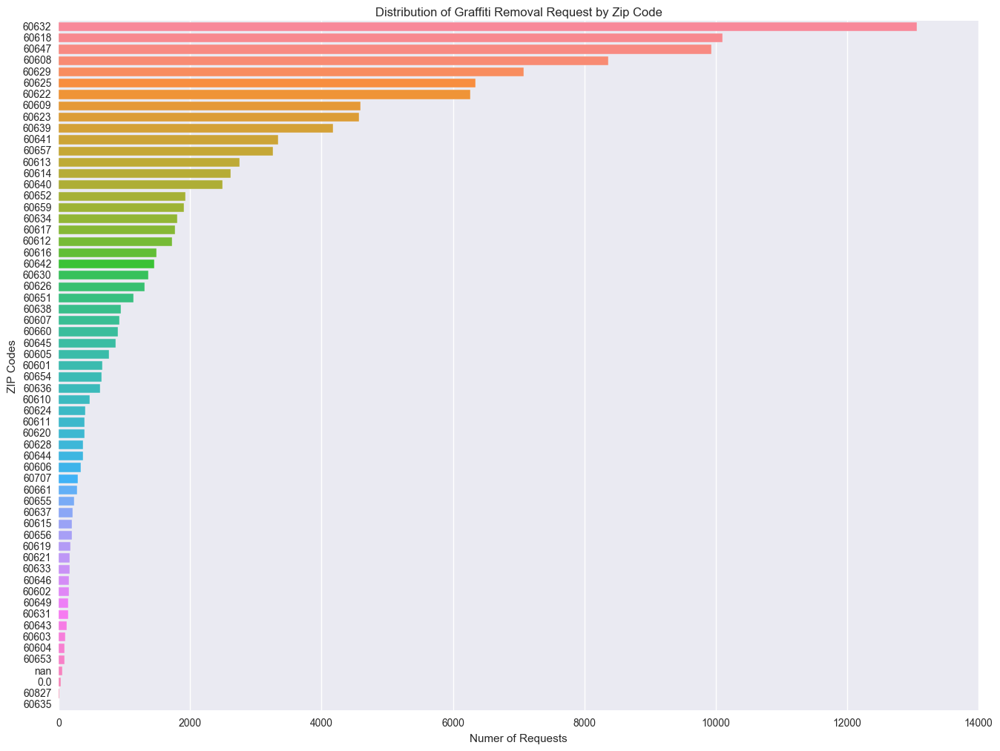

In [19]:
plt.figure(figsize=(16, 12))
g = sns.countplot(y='ZIP Code', saturation= 1, data=graffiti, order=histo_graffiti.index)
plt.title('Distribution of Graffiti Removal Request by Zip Code')
plt.xlabel('Numer of Requests')
plt.ylabel('ZIP Codes')

## What if we could see this in a google maps?

## Heatmap of the Graffiti removal request

In [20]:
gmaps.configure(api_key=os.environ["GOOGLE_API_KEY"])

In [21]:
ubicacion_graffiti = list(graffiti['location-tuple'])
ubicacion_graffiti[0]

(41.891709698384169, -87.630982187188508)

In [22]:
m = gmaps.Map()
m.add_layer(gmaps.heatmap_layer(ubicacion_graffiti))
m

## What type of location do the "bad guys" makes graffitis?

In [23]:
histo_place = graffiti['Where is the Graffiti located?'].value_counts()
histo_place.iloc[:10]

Front                  35362
Side                   16778
Pole                   11135
Garage                  9894
Rear                    7638
Alley                   5912
Traffic Control Box     5292
Sign                    4628
Door                    4004
Dumpster                3766
Name: Where is the Graffiti located?, dtype: int64

## People that make graffiti want to be looked...! Go on the front

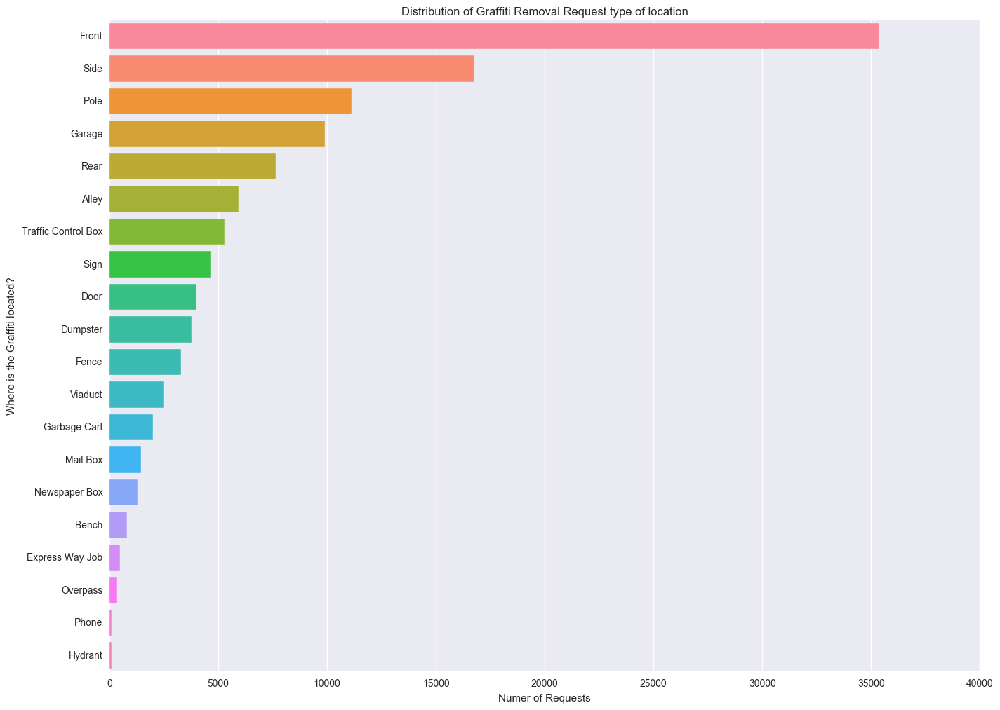

In [24]:
plt.figure(figsize=(16, 12))
g = sns.countplot(y='Where is the Graffiti located?', saturation= 1, data=graffiti, order=histo_place.index)
plt.title('Distribution of Graffiti Removal Request type of location')
plt.xlabel('Numer of Requests')

## In What type of surface?

In [25]:
histo_type = graffiti['What Type of Surface is the Graffiti on?'].value_counts()
histo_type.iloc[:10]

Metal - Painted                         37132
Brick - Unpainted                       21666
Brick - Painted                         19003
Cement (Sidewalk, Alley, Wall, Curb)     8729
Wood - Painted                           6693
Metal - Unpainted                        6334
Aluminum Siding                          5259
Glass                                    2665
Other/Unknown Surface                    2283
Vinyl Siding                             2056
Name: What Type of Surface is the Graffiti on?, dtype: int64

### Metal?... Metal fences? 

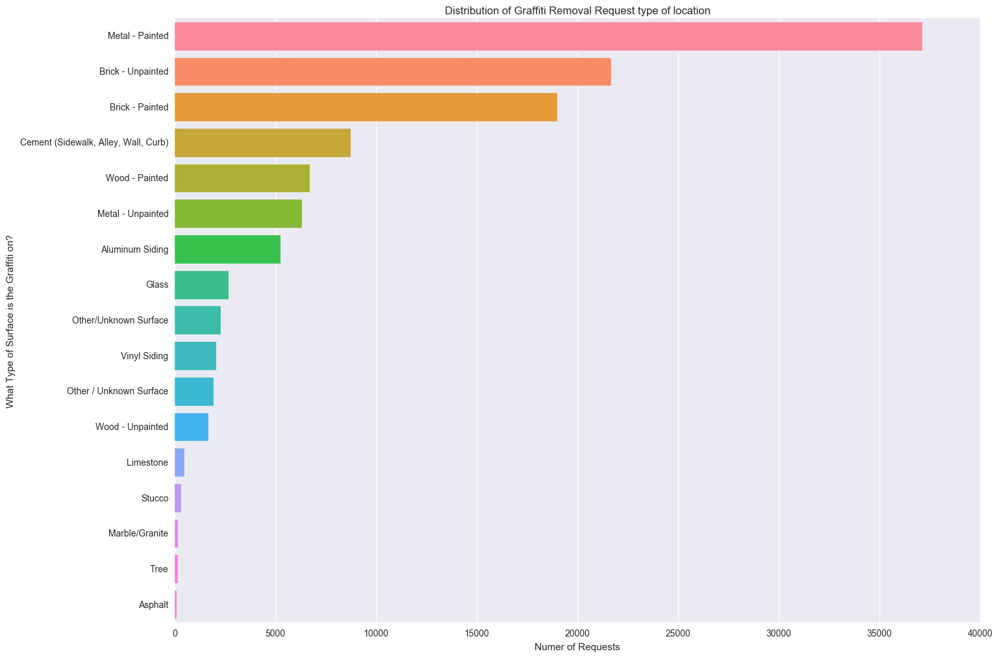

In [26]:
plt.figure(figsize=(16, 12))
g = sns.countplot(y='What Type of Surface is the Graffiti on?', saturation= 1, data=graffiti, order=histo_type.index)
plt.title('Distribution of Graffiti Removal Request type of location')
plt.xlabel('Numer of Requests')

## Analysis over Time

### How much time does it take to complete the request?

In [27]:
datetime_creation = graffiti['Creation Date']
datetime_completion = graffiti['Completion Date']

In [28]:
graffiti['Creation Date'] = pd.to_datetime(datetime_creation)
graffiti['Completion Date'] = pd.to_datetime(datetime_completion)

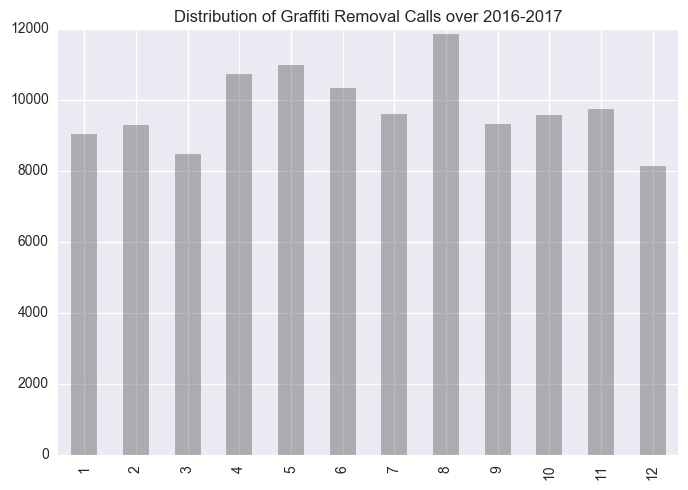

In [29]:
graffiti['Creation Date'].dt.month.value_counts(sort=False).plot.bar(color='k', alpha=0.3)
plt.title('Distribution of Graffiti Removal Calls over 2016-2017')

## Comparison between creation and completion distribution

In [30]:
g = graffiti['Completion Date'].ix[174]- graffiti['Creation Date'].ix[174]

In [31]:
g

Timedelta('1 days 00:00:00')

In [32]:
graffiti['time_elapsed'] = graffiti['Completion Date'].sub(graffiti['Creation Date'], axis=0)

In [33]:
graffiti['time_elapsed'].describe()

count                    116807
mean     0 days 16:01:32.953333
std      1 days 00:30:20.819902
min             0 days 00:00:00
25%             0 days 00:00:00
50%             0 days 00:00:00
75%             1 days 00:00:00
max            25 days 00:00:00
Name: time_elapsed, dtype: object

In [34]:
r = graffiti['time_elapsed'].dt.days.dropna().astype(int)

In [35]:
r.head()

0    0
1    0
2    0
3    0
4    0
Name: time_elapsed, dtype: int64

In [36]:
import plotly
import plotly.graph_objs as py
plotly.offline.init_notebook_mode()

In [37]:
TimeElapsed = py.Box(
    x=r,
    name = 'Elapsed time',
    marker = dict(
        color = 'rgb(234, 54, 42)',
    )
)
data = [TimeElapsed]

layout = py.Layout(
    title = "Boxplot of Time Elapses Responde Time in Days"
)

In [38]:
plotly.offline.iplot(data)

### This means that in average the completion time was in the same day... 95 % of the time is done in 2 days...that looks suspicious...
### There are some outliers that we could investigate if we could have more info...

## Building Heatmaps of date's frequency

### When do 311 recieve this kind Graffiti removal request?

In [39]:
#create a DateTimeIndex
dateTime = graffiti.set_index(pd.DatetimeIndex(graffiti['Creation Date']))
print(type(dateTime))
print(type(dateTime.index))

#create a frequency of calls per day
frequency_of_calls = graffiti['Creation Date'].value_counts()
print(frequency_of_calls.iloc[:5])
print(type(frequency_of_calls))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.tseries.index.DatetimeIndex'>
2016-04-13    717
2016-05-20    705
2016-09-22    701
2016-08-04    695
2016-08-08    667
Name: Creation Date, dtype: int64
<class 'pandas.core.series.Series'>


### HeatMap of frequency of dates 2016

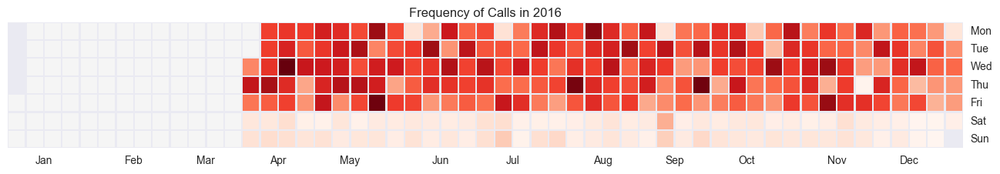

In [40]:
plt.figure(figsize=(16, 12))
calmap.yearplot(frequency_of_calls, year = 2016)
plt.title("Frequency of Calls in 2016")


### HeatMap of frequency of dates 2016

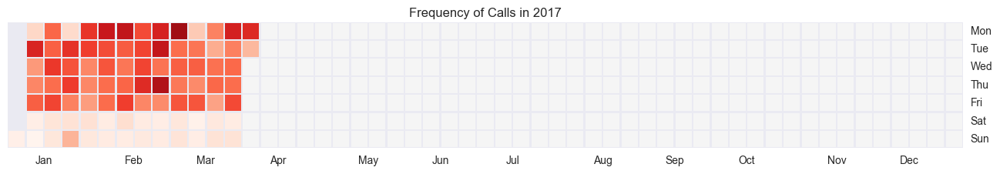

In [41]:
plt.figure(figsize=(16, 12))
calmap.yearplot(frequency_of_calls, year = 2017)
plt.title("Frequency of Calls in 2017")

### It seemes that people either do not do this type of request on wekeends or 311 does not recieve this type on weekends

### Pretty much al year long there is this type of request

_______

_______

# Pothole datase

In [42]:
pothole.head(1)

,CREATION DATE,STATUS,COMPLETION DATE,SERVICE REQUEST NUMBER,TYPE OF SERVICE REQUEST,CURRENT ACTIVITY,MOST RECENT ACTION,NUMBER OF POTHOLES FILLED ON BLOCK,STREET ADDRESS,ZIP,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,SSA,LATITUDE,LONGITUDE,LOCATION
0,03/30/2016,Completed,03/30/2016,16-02136778,Pothole in Street,Final Outcome,Pothole Patched,16.0,3845 N CICERO AVE,60641.0,1.143679e+06,1.925230e+06,45.0,17.0,15.0,28.0,41.951123,-87.747105,"(41.95112319391782, -87.74710499089163)"


## Checkout very quickly columns and data before importation

In [43]:
!cd data && head -n 2 pothole.csv

CREATION DATE,STATUS,COMPLETION DATE,SERVICE REQUEST NUMBER,TYPE OF SERVICE REQUEST,CURRENT ACTIVITY,MOST RECENT ACTION,NUMBER OF POTHOLES FILLED ON BLOCK,STREET ADDRESS,ZIP,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,SSA,LATITUDE,LONGITUDE,LOCATION
03/30/2016,Completed,03/30/2016,16-02136778,Pothole in Street,Final Outcome,Pothole Patched,16,3845 N CICERO AVE,60641,1143679.22201736,1925230.24367508,45,17,15,28,41.95112319391782,-87.74710499089163,"(41.95112319391782, -87.74710499089163)"


## Types of Columns

In [44]:
pothole.dtypes

CREATION DATE                          object
STATUS                                 object
COMPLETION DATE                        object
SERVICE REQUEST NUMBER                 object
TYPE OF SERVICE REQUEST                object
CURRENT ACTIVITY                       object
MOST RECENT ACTION                     object
NUMBER OF POTHOLES FILLED ON BLOCK    float64
STREET ADDRESS                         object
ZIP                                   float64
X COORDINATE                          float64
Y COORDINATE                          float64
Ward                                  float64
Police District                       float64
Community Area                        float64
SSA                                   float64
LATITUDE                              float64
LONGITUDE                             float64
LOCATION                               object
dtype: object

In [45]:
pothole.shape

(55595, 19)

## Let's throw out na's

In [46]:
pothole = pothole.dropna(subset =['LATITUDE'])

In [47]:
pothole = pothole.dropna(subset=['LONGITUDE'])

In [48]:
pothole.shape

(55463, 19)

## Change  values and type of columns

In [49]:
pothole['location-tuple'] = list(zip(pothole.LATITUDE, pothole.LONGITUDE))

In [50]:
float64= pothole.dtypes[pothole.dtypes == "float64"].index
for i in float64:
    pothole[i] = pothole[i].astype(str)

new_zip = np.array([zipcode[0:5] for zipcode in pothole['ZIP']])
pothole['ZIP'] = new_zip

object_type= pothole.dtypes[pothole.dtypes == "object"].index
for i in object_type:
    pothole[i] = pothole[i].astype("category")    
    
pothole.dtypes

CREATION DATE                         category
STATUS                                category
COMPLETION DATE                       category
SERVICE REQUEST NUMBER                category
TYPE OF SERVICE REQUEST               category
CURRENT ACTIVITY                      category
MOST RECENT ACTION                    category
NUMBER OF POTHOLES FILLED ON BLOCK    category
STREET ADDRESS                        category
ZIP                                   category
X COORDINATE                          category
Y COORDINATE                          category
Ward                                  category
Police District                       category
Community Area                        category
SSA                                   category
LATITUDE                              category
LONGITUDE                             category
LOCATION                              category
location-tuple                        category
dtype: object

## Check range of "Creation date" of one year

In [51]:
pothole.head(1)

,CREATION DATE,STATUS,COMPLETION DATE,SERVICE REQUEST NUMBER,TYPE OF SERVICE REQUEST,CURRENT ACTIVITY,MOST RECENT ACTION,NUMBER OF POTHOLES FILLED ON BLOCK,STREET ADDRESS,ZIP,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,SSA,LATITUDE,LONGITUDE,LOCATION,location-tuple
0,03/30/2016,Completed,03/30/2016,16-02136778,Pothole in Street,Final Outcome,Pothole Patched,16.0,3845 N CICERO AVE,60641,1143679.22202,1925230.24368,45.0,17.0,15.0,28.0,41.9511231939,-87.7471049909,"(41.95112319391782, -87.74710499089163)","(41.9511231939, -87.7471049909)"


In [52]:
pothole.tail(1)

,CREATION DATE,STATUS,COMPLETION DATE,SERVICE REQUEST NUMBER,TYPE OF SERVICE REQUEST,CURRENT ACTIVITY,MOST RECENT ACTION,NUMBER OF POTHOLES FILLED ON BLOCK,STREET ADDRESS,ZIP,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,SSA,LATITUDE,LONGITUDE,LOCATION,location-tuple
55594,03/29/2017,Open,NaN,17-01757638,Pothole in Street,NaN,NaN,nan,4055 W 69TH ST,60629,1150442.3551,1858534.07549,13.0,8.0,65.0,3.0,41.7675952985,-87.7246919258,"(41.76759529849867, -87.72469192582417)","(41.7675952985, -87.7246919258)"


### List of Columns

In [53]:
list(pothole)

['CREATION DATE',
 'STATUS',
 'COMPLETION DATE',
 'SERVICE REQUEST NUMBER',
 'TYPE OF SERVICE REQUEST',
 'CURRENT ACTIVITY',
 'MOST RECENT ACTION',
 'NUMBER OF POTHOLES FILLED ON BLOCK',
 'STREET ADDRESS',
 'ZIP',
 'X COORDINATE',
 'Y COORDINATE',
 'Ward',
 'Police District',
 'Community Area',
 'SSA',
 'LATITUDE',
 'LONGITUDE',
 'LOCATION',
 'location-tuple']

In [54]:
columns_to_erase = ['SERVICE REQUEST NUMBER','X COORDINATE','Y COORDINATE','Ward','Police District','Community Area','SSA','LATITUDE','LONGITUDE','LOCATION']

for i in columns_to_erase:
    del pothole[i]  # delete columns
pothole.head(1)

,CREATION DATE,STATUS,COMPLETION DATE,TYPE OF SERVICE REQUEST,CURRENT ACTIVITY,MOST RECENT ACTION,NUMBER OF POTHOLES FILLED ON BLOCK,STREET ADDRESS,ZIP,location-tuple
0,03/30/2016,Completed,03/30/2016,Pothole in Street,Final Outcome,Pothole Patched,16.0,3845 N CICERO AVE,60641,"(41.9511231939, -87.7471049909)"


## Description of categorical variables


In [55]:
categorical = pothole.dtypes[pothole.dtypes == "category"].index
pothole[categorical].describe()

,CREATION DATE,STATUS,COMPLETION DATE,TYPE OF SERVICE REQUEST,CURRENT ACTIVITY,MOST RECENT ACTION,NUMBER OF POTHOLES FILLED ON BLOCK,STREET ADDRESS,ZIP,location-tuple
count,55463,55463,52499,55463,38938,38911,55463,55463,55463,55463
unique,365,4,261,1,6,21,176,41698,62,41577
top,04/05/2016,Completed,06/01/2016,Pothole in Street,Final Outcome,Pothole Patched,nan,7900 S KEDZIE AVE,60617,"(41.7497239717, -87.7025395717)"
freq,713,38890,596,55463,38893,31913,16484,80,2238,80


### Let's see where are the most request zipcodes zones'

In [56]:
histo_pothole = pothole['ZIP'].value_counts()
histo_pothole.iloc[:10]

60617    2238
60643    2157
60629    2014
60628    1930
60618    1915
60619    1841
60630    1800
60620    1750
60638    1735
60634    1689
Name: ZIP, dtype: int64

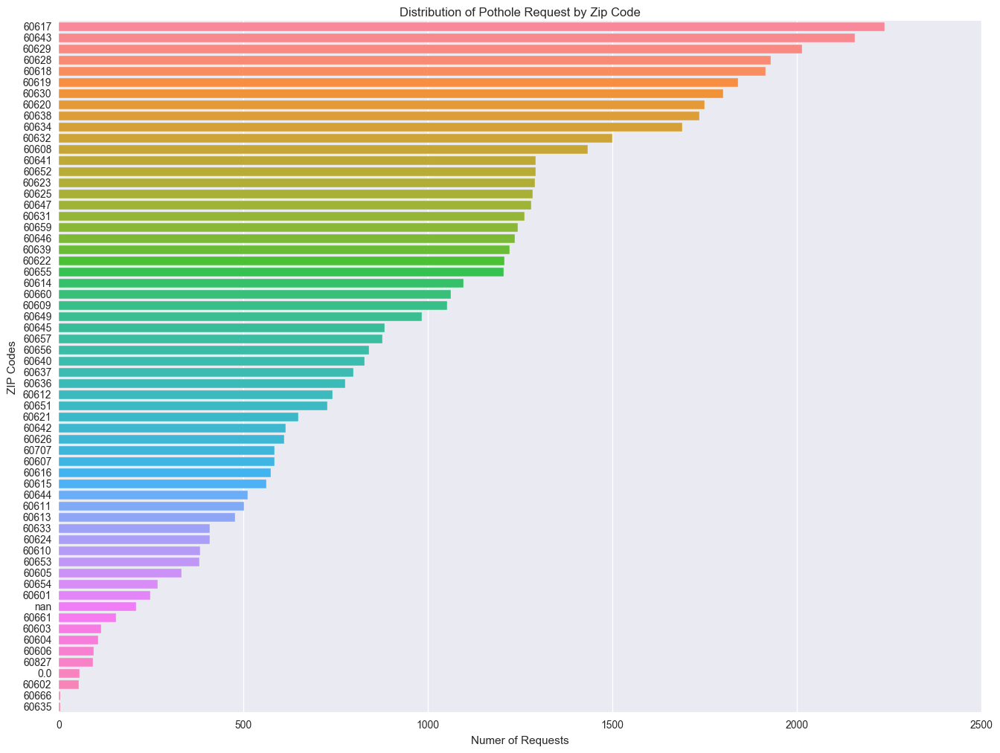

In [57]:
plt.figure(figsize=(16, 12))
g = sns.countplot(y='ZIP', saturation= 1, data=pothole, order=histo_pothole.index)
plt.title('Distribution of Pothole Request by Zip Code')
plt.xlabel('Numer of Requests')
plt.ylabel('ZIP Codes')

## Heatmap of the Pothole removal request

In [58]:
gmaps.configure(api_key=os.environ["GOOGLE_API_KEY"])

In [59]:
import gmaps.datasets

In [60]:
ubicacion_pothole = list(pothole['location-tuple'])

In [61]:
ubicacion_pothole[0]
len(ubicacion_pothole)

55463

In [178]:
m = gmaps.Map()
m.add_layer(gmaps.heatmap_layer(ubicacion_pothole))
m

# Analysis over time

In [63]:
datetime_creation = pothole['CREATION DATE']
datetime_completion = pothole['COMPLETION DATE']

In [64]:
pothole['CREATION DATE'] = pd.to_datetime(datetime_creation)
pothole['COMPLETION DATE'] = pd.to_datetime(datetime_completion)
pothole.dtypes

CREATION DATE                         datetime64[ns]
STATUS                                      category
COMPLETION DATE                       datetime64[ns]
TYPE OF SERVICE REQUEST                     category
CURRENT ACTIVITY                            category
MOST RECENT ACTION                          category
NUMBER OF POTHOLES FILLED ON BLOCK          category
STREET ADDRESS                              category
ZIP                                         category
location-tuple                              category
dtype: object

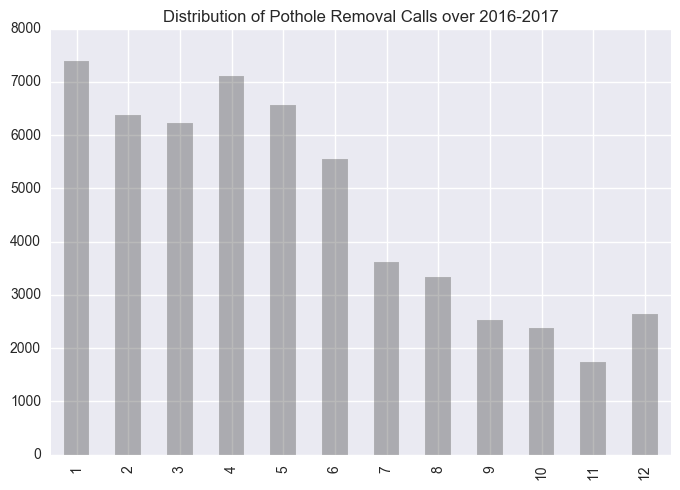

In [65]:
pothole['CREATION DATE'].dt.month.value_counts(sort=False).plot.bar(color='k', alpha=0.3)
plt.title('Distribution of Pothole Removal Calls over 2016-2017')

## Comparison between creation and completion distribution

In [66]:
for i in range(len(pothole['CREATION DATE'])):
    pothole['time_elapsed'] = pothole['COMPLETION DATE'].iloc[i] - pothole['CREATION DATE'].iloc[i]

In [67]:
pothole['COMPLETION DATE'].iloc[80] - pothole['CREATION DATE'].iloc[80]

Timedelta('1 days 00:00:00')

In [68]:
pothole.head(1)

,CREATION DATE,STATUS,COMPLETION DATE,TYPE OF SERVICE REQUEST,CURRENT ACTIVITY,MOST RECENT ACTION,NUMBER OF POTHOLES FILLED ON BLOCK,STREET ADDRESS,ZIP,location-tuple,time_elapsed
0,2016-03-30,Completed,2016-03-30,Pothole in Street,Final Outcome,Pothole Patched,16.0,3845 N CICERO AVE,60641,"(41.9511231939, -87.7471049909)",NaT


In [69]:
pothole['time_elapsed'] = pothole['COMPLETION DATE'].sub(pothole['CREATION DATE'], axis=0)

In [70]:
pothole['time_elapsed'].describe()

count                      52499
mean     23 days 15:00:54.515324
std      35 days 12:40:48.626056
min              0 days 00:00:00
25%              2 days 00:00:00
50%              8 days 00:00:00
75%             30 days 00:00:00
max            321 days 00:00:00
Name: time_elapsed, dtype: object

In [71]:
r = pothole['time_elapsed'].dt.days.dropna().astype(int)

In [72]:
r.head()

0    0
1    0
2    0
3    0
4    0
Name: time_elapsed, dtype: int64

In [73]:
import plotly
import plotly.graph_objs as py
plotly.offline.init_notebook_mode()

In [74]:
TimeElapsed = py.Box(
    x=r,
    name = 'Elapsed time',
    marker = dict(
        color = 'rgb(234, 54, 42)',
    )
)
data = [TimeElapsed]

layout = py.Layout(
    title = "Boxplot of Time Elapses Responde Time in Days"
)

In [75]:
plotly.offline.iplot(data)

## HeatMap of frequency of dates 2016

In [76]:
#create a DateTimeIndex
dateTime = pothole.set_index(pd.DatetimeIndex(pothole['CREATION DATE']))
print(type(dateTime))
print(type(dateTime.index))

#create a frequency of calls per day
frequency_of_calls = pothole['CREATION DATE'].value_counts()
print(frequency_of_calls.iloc[:5])
print(type(frequency_of_calls))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.tseries.index.DatetimeIndex'>
2016-04-05    713
2017-01-23    559
2016-04-14    481
2017-01-24    480
2017-01-18    478
Name: CREATION DATE, dtype: int64
<class 'pandas.core.series.Series'>


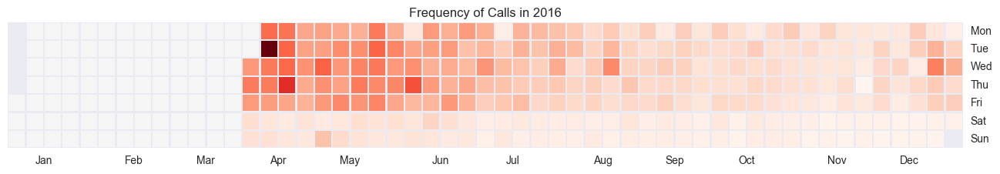

In [77]:
plt.figure(figsize=(16, 12))
calmap.yearplot(frequency_of_calls, year = 2016)
plt.title("Frequency of Calls in 2016")


### HeatMap of frequency of dates 2016

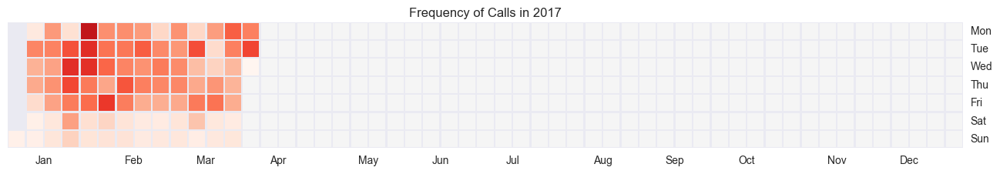

In [78]:
plt.figure(figsize=(16, 12))
calmap.yearplot(frequency_of_calls, year = 2017)
plt.title("Frequency of Calls in 2017")

______

_____

# Sanitation datase

In [79]:
sanitation.head(1)

,Creation Date,Status,Completion Date,Service Request Number,Type of Service Request,What is the Nature of this Code Violation?,Street Address,ZIP Code,X Coordinate,Y Coordinate,Ward,Police District,Community Area,Latitude,Longitude,Location
0,03/30/2016,Completed,03/30/2016,16-02124727,Sanitation Code Violation,Dog feces in yard,4317 W 47TH ST,60632.0,1.148281e+06,1.873116e+06,14.0,8.0,57.0,41.807769,-87.731672,"(41.8077690037055, -87.73167218108902)"


## Checkout very quickly columns and data before importation

In [80]:
!cd data && head -n 2 sanitation.csv

Creation Date,Status,Completion Date,Service Request Number,Type of Service Request,What is the Nature of this Code Violation?,Street Address,ZIP Code,X Coordinate,Y Coordinate,Ward,Police District,Community Area,Latitude,Longitude,Location
03/30/2016,Completed,03/30/2016,16-02124727,Sanitation Code Violation,Dog feces in yard,4317 W 47TH ST,60632,1148280.79012198,1873115.58757275,14,8,57,41.8077690037055,-87.73167218108902,"(41.8077690037055, -87.73167218108902)"


In [81]:
sanitation.dtypes

Creation Date                                  object
Status                                         object
Completion Date                                object
Service Request Number                         object
Type of Service Request                        object
What is the Nature of this Code Violation?     object
Street Address                                 object
ZIP Code                                      float64
X Coordinate                                  float64
Y Coordinate                                  float64
Ward                                          float64
Police District                               float64
Community Area                                float64
Latitude                                      float64
Longitude                                     float64
Location                                       object
dtype: object

In [82]:
sanitation.shape

(21444, 16)

## Let's throw out na's

In [83]:
sanitation = sanitation.dropna(subset =['Latitude'])

In [84]:
sanitation = sanitation.dropna(subset=['Longitude'])

In [85]:
pothole.shape

(55463, 11)

## Change  values and type of columns

In [86]:
sanitation['location-tuple'] = list(zip(sanitation.Latitude, sanitation.Longitude))

In [87]:
float64= sanitation.dtypes[sanitation.dtypes == "float64"].index
for i in float64:
    sanitation[i] = sanitation[i].astype(str)

new_zip = np.array([zipcode[0:5] for zipcode in sanitation['ZIP Code']])
sanitation['ZIP Code'] = new_zip

object_type= sanitation.dtypes[sanitation.dtypes == "object"].index
for i in object_type:
    sanitation[i] = sanitation[i].astype("category")    
    
sanitation.dtypes

Creation Date                                 category
Status                                        category
Completion Date                               category
Service Request Number                        category
Type of Service Request                       category
What is the Nature of this Code Violation?    category
Street Address                                category
ZIP Code                                      category
X Coordinate                                  category
Y Coordinate                                  category
Ward                                          category
Police District                               category
Community Area                                category
Latitude                                      category
Longitude                                     category
Location                                      category
location-tuple                                category
dtype: object

## Check range of "Creation date" of one year

In [88]:
sanitation.head(1)

,Creation Date,Status,Completion Date,Service Request Number,Type of Service Request,What is the Nature of this Code Violation?,Street Address,ZIP Code,X Coordinate,Y Coordinate,Ward,Police District,Community Area,Latitude,Longitude,Location,location-tuple
0,03/30/2016,Completed,03/30/2016,16-02124727,Sanitation Code Violation,Dog feces in yard,4317 W 47TH ST,60632,1148280.79012,1873115.58757,14.0,8.0,57.0,41.8077690037,-87.7316721811,"(41.8077690037055, -87.73167218108902)","(41.8077690037, -87.7316721811)"


In [89]:
sanitation.tail(1)

,Creation Date,Status,Completion Date,Service Request Number,Type of Service Request,What is the Nature of this Code Violation?,Street Address,ZIP Code,X Coordinate,Y Coordinate,Ward,Police District,Community Area,Latitude,Longitude,Location,location-tuple
21443,03/28/2017,Open,NaN,17-01739920,Sanitation Code Violation,Dumpster not being emptied,1433 N WELLS ST,60610,1174442.60242,1909899.25943,27.0,18.0,8.0,41.9081634077,-87.6346197654,"(41.908163407672994, -87.6346197654472)","(41.9081634077, -87.6346197654)"


In [90]:
columns_to_erase = ['Service Request Number','X Coordinate', 'Y Coordinate','Ward','Police District','Community Area','Latitude','Longitude','Location']

for i in columns_to_erase:
    del sanitation[i]  # delete columns
sanitation.head(1)

,Creation Date,Status,Completion Date,Type of Service Request,What is the Nature of this Code Violation?,Street Address,ZIP Code,location-tuple
0,03/30/2016,Completed,03/30/2016,Sanitation Code Violation,Dog feces in yard,4317 W 47TH ST,60632,"(41.8077690037, -87.7316721811)"


## Description of categorical variables


In [91]:
categorical = sanitation.dtypes[sanitation.dtypes == "category"].index
sanitation[categorical].describe()

,Creation Date,Status,Completion Date,Type of Service Request,What is the Nature of this Code Violation?,Street Address,ZIP Code,location-tuple
count,21443,21443,21202,21443,20982,21443,21443,21443
unique,364,4,322,1,9,16114,59,16049
top,06/14/2016,Completed,08/02/2016,Sanitation Code Violation,Other,4048 N MOZART ST,60632,"(41.9548460781, -87.6994914888)"
freq,149,20295,309,21443,8370,82,1151,82


## Let's see where are the most request zipcodes zones'

In [92]:
histo_sanitation = sanitation['ZIP Code'].value_counts()
histo_sanitation.iloc[:10]

60632    1151
60628    1007
60620     926
60618     918
60619     898
60614     885
60647     827
60617     784
60629     675
60651     674
Name: ZIP Code, dtype: int64

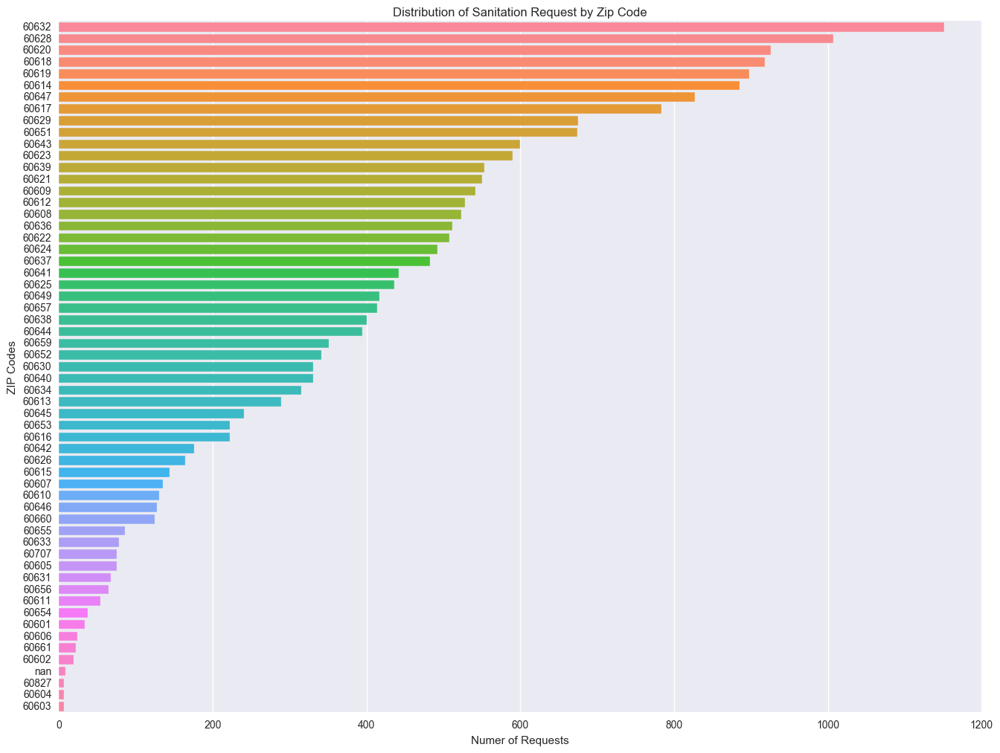

In [93]:
plt.figure(figsize=(16, 12))
g = sns.countplot(y='ZIP Code', saturation= 1, data=sanitation, order=histo_sanitation.index)
plt.title('Distribution of Sanitation Request by Zip Code')
plt.xlabel('Numer of Requests')
plt.ylabel('ZIP Codes')

## What type of saniation request are more demanded?

In [94]:
histo_place = sanitation['What is the Nature of this Code Violation?'].value_counts()
histo_place.iloc[:10]

Other                                  8370
Garbage in yard                        3920
Garbage in alley                       3108
Overflowing carts                      1613
Dumpster not being emptied             1543
Dog feces in yard                      1191
Construction Site Cleanliness/Fence     894
Standing water                          314
Graffiti Commercial Vehicle              29
Name: What is the Nature of this Code Violation?, dtype: int64

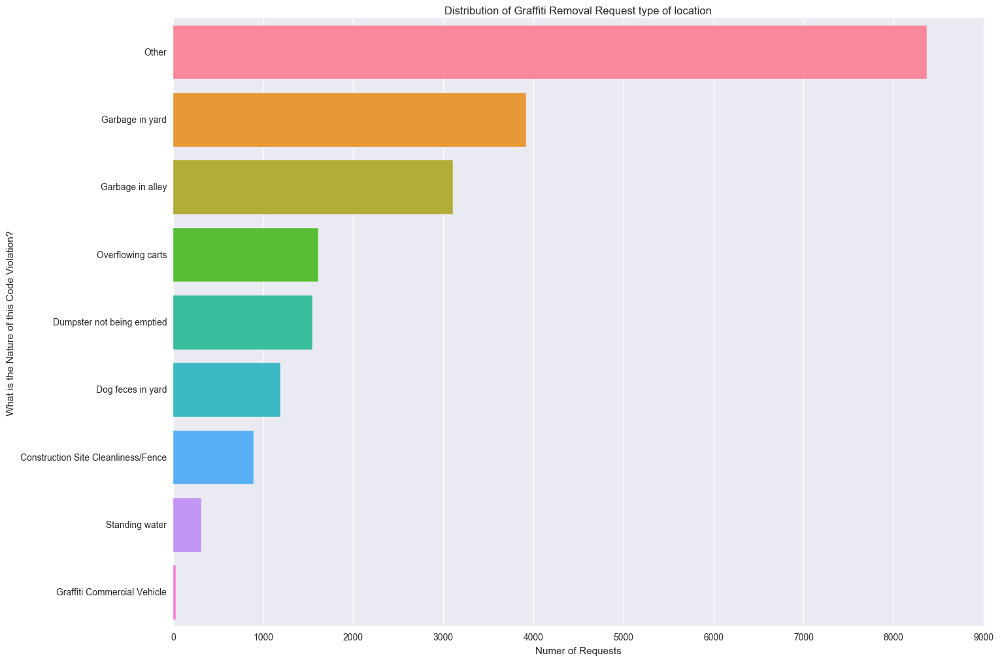

In [95]:
plt.figure(figsize=(16, 12))
g = sns.countplot(y='What is the Nature of this Code Violation?', saturation= 1, data=sanitation, order=histo_place.index)
plt.title('Distribution of Graffiti Removal Request type of location')
plt.xlabel('Numer of Requests')

## Heatmap of the Sanitation removal request

In [96]:
gmaps.configure(api_key=os.environ["GOOGLE_API_KEY"])

In [97]:
ubicacion_sanitation = list(sanitation['location-tuple'])
ubicacion_sanitation[0]

(41.807769003705502, -87.731672181089024)

In [98]:
m = gmaps.Map()
m.add_layer(gmaps.heatmap_layer(ubicacion_sanitation))
m

# Analysis over time

In [99]:
datetime_creation = sanitation['Creation Date']
datetime_completion = sanitation['Completion Date']

In [100]:
sanitation['Creation Date'] = pd.to_datetime(datetime_creation)
sanitation['Completion Date'] = pd.to_datetime(datetime_completion)

In [101]:
sanitation.dtypes

Creation Date                                 datetime64[ns]
Status                                              category
Completion Date                               datetime64[ns]
Type of Service Request                             category
What is the Nature of this Code Violation?          category
Street Address                                      category
ZIP Code                                            category
location-tuple                                      category
dtype: object

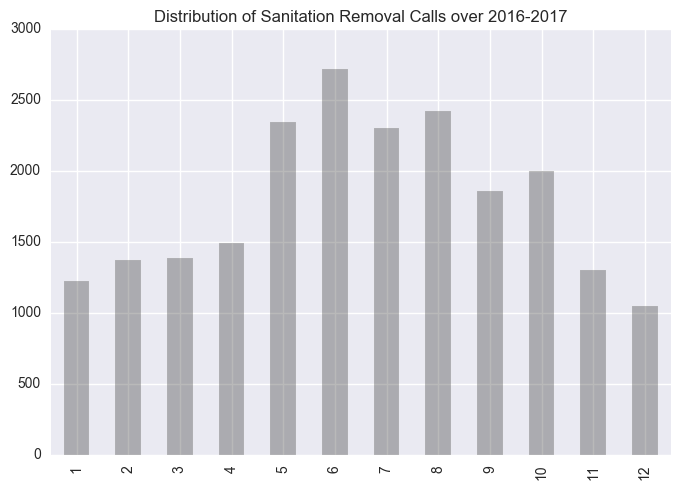

In [102]:
sanitation['Creation Date'].dt.month.value_counts(sort=False).plot.bar(color='k', alpha=0.3)
plt.title('Distribution of Sanitation Removal Calls over 2016-2017')

## Comparison between creation and completion distribution

In [103]:
for i in range(len(sanitation['Creation Date'])):
    sanitation['time_elapsed'] = sanitation['Completion Date'].iloc[i]- sanitation['Creation Date'].iloc[i]

In [104]:
sanitation.head(1)

,Creation Date,Status,Completion Date,Type of Service Request,What is the Nature of this Code Violation?,Street Address,ZIP Code,location-tuple,time_elapsed
0,2016-03-30,Completed,2016-03-30,Sanitation Code Violation,Dog feces in yard,4317 W 47TH ST,60632,"(41.8077690037, -87.7316721811)",NaT


In [105]:
sanitation['Completion Date'].iloc[80] - sanitation['Creation Date'].iloc[80]

Timedelta('1 days 00:00:00')

In [106]:
sanitation['time_elapsed'] = sanitation['Completion Date'].sub(sanitation['Creation Date'], axis=0)

In [107]:
sanitation['time_elapsed'].describe()

count                      21202
mean      8 days 21:09:51.906423
std      13 days 22:49:56.765514
min              0 days 00:00:00
25%              2 days 00:00:00
50%              4 days 00:00:00
75%             11 days 00:00:00
max            183 days 00:00:00
Name: time_elapsed, dtype: object

In [108]:
r = sanitation['time_elapsed'].dt.days.dropna().astype(int)

In [109]:
r.head()

0    0
1    0
2    0
3    0
4    1
Name: time_elapsed, dtype: int64

In [110]:
import plotly
import plotly.graph_objs as py
plotly.offline.init_notebook_mode()

In [111]:
TimeElapsed = py.Box(
    x=r,
    name = 'Elapsed time',
    marker = dict(
        color = 'rgb(234, 54, 42)',
    )
)
data = [TimeElapsed]

layout = py.Layout(
    title = "Boxplot of Time Elapses Responde Time in Days"
)

In [112]:
plotly.offline.iplot(data)

## Building Heatmaps of date's frequency

In [113]:
#create a DateTimeIndex
dateTime = sanitation.set_index(pd.DatetimeIndex(sanitation['Creation Date']))
print(type(dateTime))
print(type(dateTime.index))

#create a frequency of calls per day
frequency_of_calls = sanitation['Creation Date'].value_counts()
print(frequency_of_calls.iloc[:5])
print(type(frequency_of_calls))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.tseries.index.DatetimeIndex'>
2016-06-14    149
2016-08-01    137
2016-08-02    133
2016-10-18    132
2016-06-21    129
Name: Creation Date, dtype: int64
<class 'pandas.core.series.Series'>


### HeatMap of frequency of dates 2016

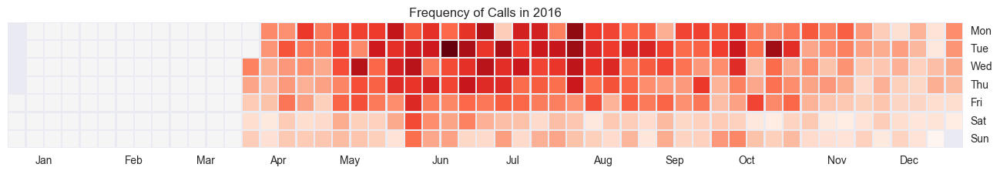

In [114]:
plt.figure(figsize=(16, 12))
calmap.yearplot(frequency_of_calls, year = 2016)
plt.title("Frequency of Calls in 2016")


### HeatMap of frequency of dates 2016

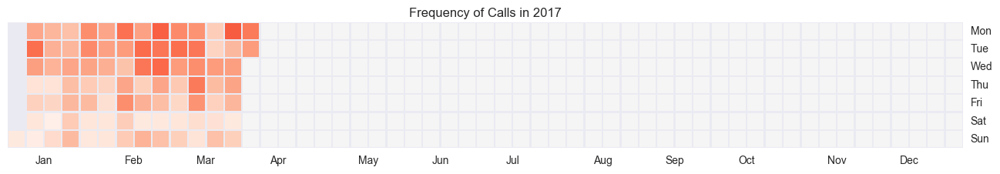

In [115]:
plt.figure(figsize=(16, 12))
calmap.yearplot(frequency_of_calls, year = 2017)
plt.title("Frequency of Calls in 2017")

_______

____

# Vacant datase

In [116]:
vacant = pd.read_csv('/Users/schzcas/Documents/github/machine-learning-public-policy/diagnostic/data/vacant.csv')


In [117]:
vacant.head(2)

,SERVICE REQUEST TYPE,SERVICE REQUEST NUMBER,DATE SERVICE REQUEST WAS RECEIVED,"LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).",IS THE BUILDING DANGEROUS OR HAZARDOUS?,IS BUILDING OPEN OR BOARDED?,"IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?",IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?,IS THE BUILDING VACANT DUE TO FIRE?,"ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)",...,ADDRESS STREET SUFFIX,ZIP CODE,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,LATITUDE,LONGITUDE,Location
0,Vacant/Abandoned Building,16-02126660,03/30/2016,Front,NaN,Open,FRONT DOOR,Vacant,False,True,...,ST,60609.0,1.167570e+06,1.869478e+06,20.0,9.0,61.0,41.797394,-87.661029,"(41.7973939805301, -87.6610292301867)"
1,Vacant/Abandoned Building,16-02132723,03/30/2016,Rear,NaN,Open,REAR,Vacant,False,False,...,ST,60617.0,1.190998e+06,1.841035e+06,7.0,4.0,51.0,41.718810,-87.576032,"(41.71881025864325, -87.57603247957272)"


In [118]:
vacant.dtypes

SERVICE REQUEST TYPE                                                      object
SERVICE REQUEST NUMBER                                                    object
DATE SERVICE REQUEST WAS RECEIVED                                         object
LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).     object
IS THE BUILDING DANGEROUS OR HAZARDOUS?                                  float64
IS BUILDING OPEN OR BOARDED?                                              object
IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?                        object
IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?                             object
IS THE BUILDING VACANT DUE TO FIRE?                                       object
ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)                     object
ADDRESS STREET NUMBER                                                      int64
ADDRESS STREET DIRECTION                                                  object
ADDRESS STREET NAME         

In [119]:
vacant.shape

(4756, 23)

### Let's throw out na's

In [120]:
vacant = vacant.dropna(subset =['LATITUDE'])

In [121]:
vacant = vacant.dropna(subset=['LONGITUDE'])

In [122]:
vacant.shape

(4754, 23)

### Change  values and type of columns

In [123]:
vacant['location-tuple'] = list(zip(vacant.LATITUDE, vacant.LONGITUDE))

In [124]:
object_type= vacant.dtypes[vacant.dtypes == "int64"].index
for i in object_type:
    vacant[i] = vacant[i].astype(str)  

In [125]:
float64= vacant.dtypes[vacant.dtypes == "float64"].index
for i in float64:
    vacant[i] = vacant[i].astype(str)

new_zip = np.array([zipcode[0:5] for zipcode in vacant['ZIP CODE']])
vacant['ZIP CODE'] = new_zip

object_type= vacant.dtypes[vacant.dtypes == "object"].index
for i in object_type:
    vacant[i] = vacant[i].astype("category")


    
vacant.dtypes

SERVICE REQUEST TYPE                                                     category
SERVICE REQUEST NUMBER                                                   category
DATE SERVICE REQUEST WAS RECEIVED                                        category
LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).    category
IS THE BUILDING DANGEROUS OR HAZARDOUS?                                  category
IS BUILDING OPEN OR BOARDED?                                             category
IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?                       category
IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?                            category
IS THE BUILDING VACANT DUE TO FIRE?                                      category
ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)                    category
ADDRESS STREET NUMBER                                                    category
ADDRESS STREET DIRECTION                                                 category
ADDRESS STREET N

### Check range of "Creation date" of one year

In [126]:
vacant.head(1)

,SERVICE REQUEST TYPE,SERVICE REQUEST NUMBER,DATE SERVICE REQUEST WAS RECEIVED,"LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).",IS THE BUILDING DANGEROUS OR HAZARDOUS?,IS BUILDING OPEN OR BOARDED?,"IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?",IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?,IS THE BUILDING VACANT DUE TO FIRE?,"ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)",...,ZIP CODE,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,LATITUDE,LONGITUDE,Location,location-tuple
0,Vacant/Abandoned Building,16-02126660,03/30/2016,Front,nan,Open,FRONT DOOR,Vacant,False,True,...,60609,1167569.83317,1869477.73331,20.0,9.0,61.0,41.7973939805,-87.6610292302,"(41.7973939805301, -87.6610292301867)","(41.7973939805, -87.6610292302)"


In [127]:
vacant.tail(1)

,SERVICE REQUEST TYPE,SERVICE REQUEST NUMBER,DATE SERVICE REQUEST WAS RECEIVED,"LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).",IS THE BUILDING DANGEROUS OR HAZARDOUS?,IS BUILDING OPEN OR BOARDED?,"IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?",IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?,IS THE BUILDING VACANT DUE TO FIRE?,"ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)",...,ZIP CODE,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,LATITUDE,LONGITUDE,Location,location-tuple
4755,Vacant/Abandoned Building,17-01749291,03/28/2017,Front,nan,Open,NaN,Vacant,False,False,...,60636,1164635.48001,1867828.84802,15.0,7.0,67.0,41.7929317084,-87.6718364599,"(41.79293170844507, -87.67183645991896)","(41.7929317084, -87.6718364599)"


### Description of categorical variables


In [128]:
categorical = vacant.dtypes[vacant.dtypes == "category"].index
vacant[categorical].describe()

,SERVICE REQUEST TYPE,SERVICE REQUEST NUMBER,DATE SERVICE REQUEST WAS RECEIVED,"LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).",IS THE BUILDING DANGEROUS OR HAZARDOUS?,IS BUILDING OPEN OR BOARDED?,"IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?",IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?,IS THE BUILDING VACANT DUE TO FIRE?,"ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)",...,ZIP CODE,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,LATITUDE,LONGITUDE,Location,location-tuple
count,4754,4754,4754,4079,4754,4086,2331,4087,4077,4085,...,4754,4754,4754,4754,4754,4754,4754,4754,4754,4754
unique,1,4754,361,3,1,2,764,2,2,2,...,51,4062,4062,51,24,77,4063,4063,4063,4063
top,Vacant/Abandoned Building,17-01749291,05/17/2016,Front,nan,Open,FRONT,Vacant,False,False,...,60636,1181669.35618,1877306.96991,16.0,7.0,67.0,41.8187015097,-87.6095356666,"(41.81870150971542, -87.63126243420638)","(41.8187015097, -87.6312624342)"
freq,4754,1,79,3213,4754,3317,320,4024,3693,2466,...,535,5,5,436,837,474,5,5,5,5


In [129]:
columns_to_erase = ['SERVICE REQUEST TYPE','SERVICE REQUEST NUMBER','X COORDINATE','Y COORDINATE','Ward','Police District','Community Area','LATITUDE','LONGITUDE','Location']

for i in columns_to_erase:
    del vacant[i]  # delete columns
vacant.head(1)

,DATE SERVICE REQUEST WAS RECEIVED,"LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).",IS THE BUILDING DANGEROUS OR HAZARDOUS?,IS BUILDING OPEN OR BOARDED?,"IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?",IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?,IS THE BUILDING VACANT DUE TO FIRE?,"ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)",ADDRESS STREET NUMBER,ADDRESS STREET DIRECTION,ADDRESS STREET NAME,ADDRESS STREET SUFFIX,ZIP CODE,location-tuple
0,03/30/2016,Front,nan,Open,FRONT DOOR,Vacant,False,True,5318,S,BISHOP,ST,60609,"(41.7973939805, -87.6610292302)"


In [176]:
histo_vacant = vacant['ZIP CODE'].value_counts()
histo_vacant.iloc[:10]

60636    535
60628    515
60620    393
60619    374
60621    366
60617    324
60609    300
60637    197
60643    195
60629    172
Name: ZIP CODE, dtype: int64

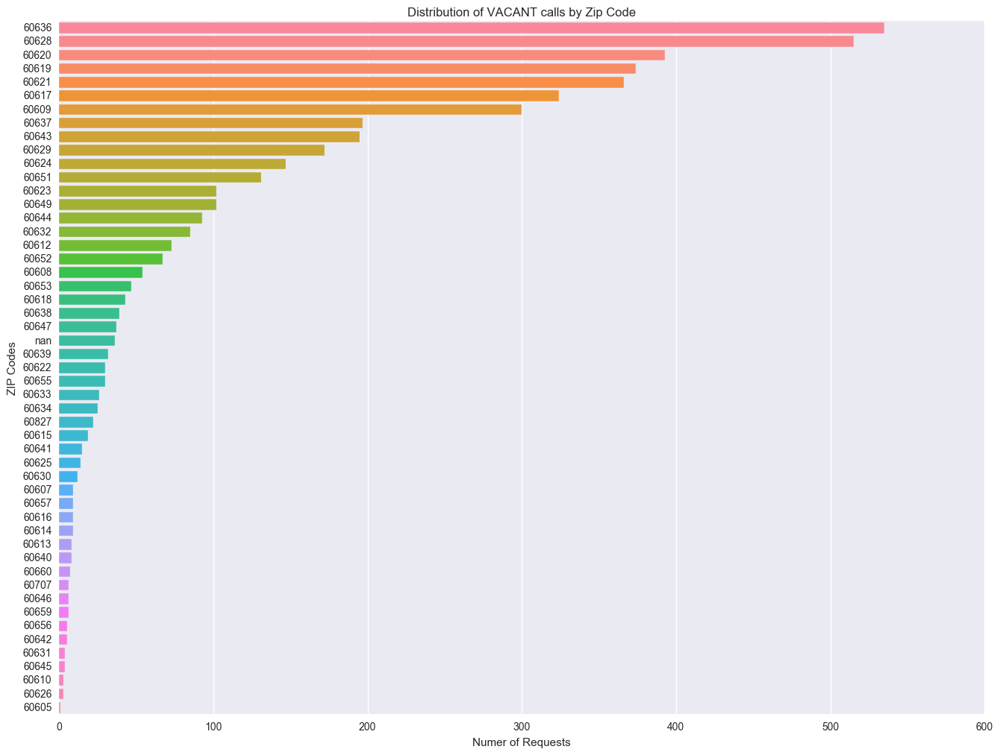

In [177]:
plt.figure(figsize=(16, 12))
g = sns.countplot(y='ZIP CODE', saturation= 1, data=vacant, order=histo_vacant.index)
plt.title('Distribution of VACANT calls by Zip Code')
plt.xlabel('Numer of Requests')
plt.ylabel('ZIP Codes')

## Heatmap of the vacant removal request

In [130]:
gmaps.configure(api_key=os.environ["GOOGLE_API_KEY"])

In [131]:
import gmaps.datasets

In [132]:
ubicacion_vacant = list(vacant['location-tuple'])

In [133]:
ubicacion_vacant[0]

(41.797393980530103, -87.661029230186713)

In [134]:
import math
ubicacion_vacant = [t for t in ubicacion_vacant if not any(isinstance(n, float) and math.isnan(n) for n in t)]

In [135]:
len(ubicacion_vacant)

4754

In [136]:
m = gmaps.Map()
m.add_layer(gmaps.heatmap_layer(ubicacion_vacant))
m

# Analysis over time

In [137]:
datetime_column = vacant['DATE SERVICE REQUEST WAS RECEIVED']

In [138]:
vacant['DATE SERVICE REQUEST WAS RECEIVED'] = pd.to_datetime(datetime_column)
vacant['DATE SERVICE REQUEST WAS RECEIVED'].dtypes

vacant.head()

,DATE SERVICE REQUEST WAS RECEIVED,"LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).",IS THE BUILDING DANGEROUS OR HAZARDOUS?,IS BUILDING OPEN OR BOARDED?,"IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?",IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?,IS THE BUILDING VACANT DUE TO FIRE?,"ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)",ADDRESS STREET NUMBER,ADDRESS STREET DIRECTION,ADDRESS STREET NAME,ADDRESS STREET SUFFIX,ZIP CODE,location-tuple
0,2016-03-30,Front,nan,Open,FRONT DOOR,Vacant,False,True,5318,S,BISHOP,ST,60609,"(41.7973939805, -87.6610292302)"
1,2016-03-30,Rear,nan,Open,REAR,Vacant,False,False,1957,E,97TH,ST,60617,"(41.7188102586, -87.5760324796)"
2,2016-03-30,Front,nan,Boarded,UPPER WINDOWS AND SHINGLES BLOWING OFF FRONT O...,Vacant,False,False,8156,S,KENWOOD,AVE,60619,"(41.7467435077, -87.591727723)"
3,2016-03-30,Front,nan,Boarded,NaN,Vacant,False,False,8200,S,DORCHESTER,AVE,60619,"(41.7459661585, -87.5904931524)"
4,2016-03-30,Rear,nan,Open,NaN,Vacant,True,True,4609,S,HONORE,ST,60609,"(41.8102018599, -87.6710912)"


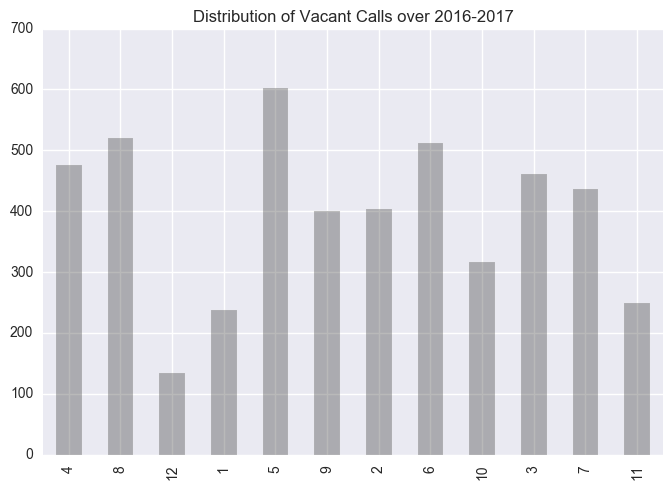

In [139]:
vacant['DATE SERVICE REQUEST WAS RECEIVED'].dt.month.value_counts(sort=False).plot.bar(color='k', alpha=0.3)
plt.title('Distribution of Vacant Calls over 2016-2017')

In [220]:
vacant_income = pd.read_pickle("vacant_income.pkl")

In [221]:
vacant_income.head(1)

,index,SERVICE REQUEST TYPE,SERVICE REQUEST NUMBER,DATE SERVICE REQUEST WAS RECEIVED,"LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).",IS THE BUILDING DANGEROUS OR HAZARDOUS?,IS BUILDING OPEN OR BOARDED?,"IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?",IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?,IS THE BUILDING VACANT DUE TO FIRE?,...,X COORDINATE,Y COORDINATE,Ward,Police District,Community Area,LATITUDE,LONGITUDE,Location,fips,average-income
0,0,Vacant/Abandoned Building,16-02126660,03/30/2016,Front,NaN,Open,FRONT DOOR,Vacant,False,...,1.167570e+06,1.869478e+06,20.0,9.0,61.0,41.797394,-87.661029,"(41.7973939805301, -87.6610292301867)",170316119001020,524


In [222]:
list_income_average = list(vacant_income['average-income'])
list_income_average_int = [int(x) for x in list_income_average]
df_income_average = pd.DataFrame({"average-income-int": list_income_average_int})
vacant_income = pd.concat([vacant_income, df_income_average], axis=1)
vacant_income.drop(['average-income'], axis=1,inplace=True)
vacant_income.drop(['index'], axis=1,inplace=True)

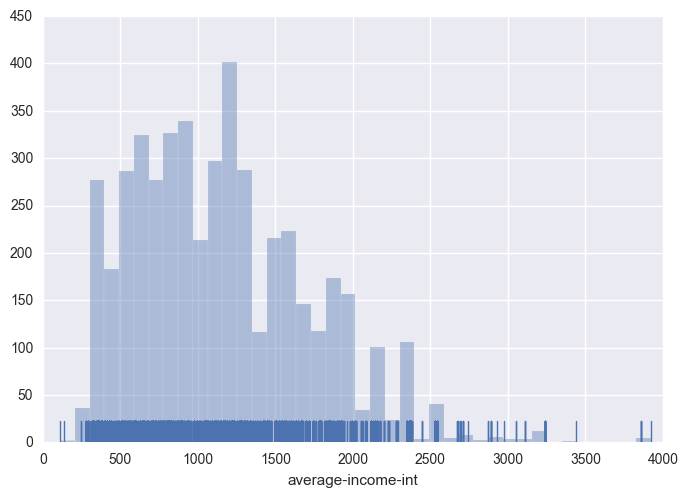

In [223]:
sns.distplot(vacant_income['average-income-int'], kde=False, rug=True)

In [234]:
data_frame_income_per_zipcode = pd.DataFrame(vacant_income['average-income-int'].groupby(vacant['ZIP CODE']).describe().unstack()['mean'].sort(ascending=True,inplace=False))

#### renaming a column

In [240]:
data_frame_income_per_zipcode.rename(columns={'mean':'average-income'}, inplace=True)
data_frame_income_per_zipcode.head(1)

,average-income
ZIP CODE,
60626,704.666667


In [241]:
histo_vacant_dataframe=pd.DataFrame(histo_vacant)

In [242]:
series_income_per_zipcode = vacant_income['average-income-int'].groupby(vacant['ZIP CODE']).describe().unstack()['mean'].sort(ascending=True,inplace=False)

In [243]:
series_income_per_zipcode.iloc[:10]

ZIP CODE
60626     704.666667
60610     832.333333
60616     927.777778
60636     989.449438
60642     997.800000
60609    1002.010000
60624    1022.693878
60615    1041.052632
60637    1072.172589
60621    1086.713115
Name: mean, dtype: float64

In [244]:
histo_vacant.iloc[:10]

60636    535
60628    515
60620    393
60619    374
60621    366
60617    324
60609    300
60637    197
60643    195
60629    172
Name: ZIP CODE, dtype: int64

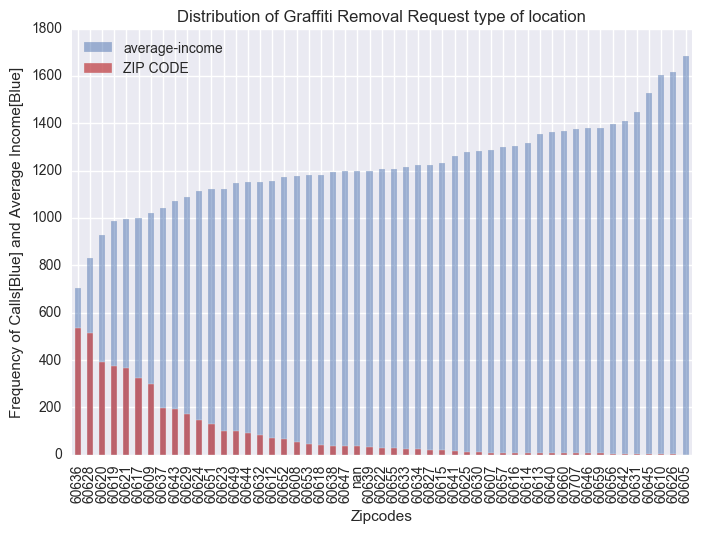

In [245]:


histo_vacant_dataframe.plot(kind='bar',ax=ax, color='r', label='Frequency of Calls', alpha =.8)
plt.title('Distribution of Graffiti Removal Request type of location')
plt.xlabel('Zipcodes')
plt.ylabel('Frequency of Calls[Blue] and Average Income[Blue]')

### HeatMap of frequency of dates 2016

In [140]:
#create a DateTimeIndex
dateTime = vacant.set_index(pd.DatetimeIndex(vacant['DATE SERVICE REQUEST WAS RECEIVED']))
print(type(dateTime))
print(type(dateTime.index))

#create a frequency of calls per day
frequency_of_calls = vacant['DATE SERVICE REQUEST WAS RECEIVED'].value_counts()
print(frequency_of_calls.iloc[:5])
print(type(frequency_of_calls))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.tseries.index.DatetimeIndex'>
2016-05-17    79
2016-04-05    48
2016-08-18    48
2016-05-25    36
2017-02-07    35
Name: DATE SERVICE REQUEST WAS RECEIVED, dtype: int64
<class 'pandas.core.series.Series'>


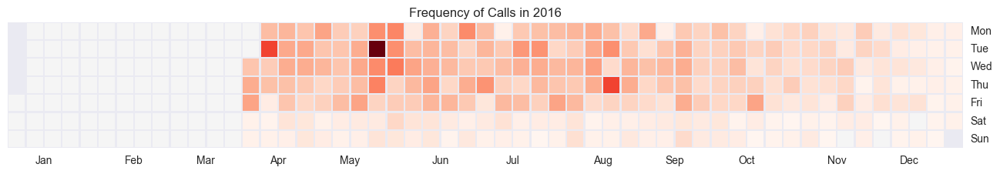

In [141]:
plt.figure(figsize=(16, 12))
calmap.yearplot(frequency_of_calls, year = 2016)
plt.title("Frequency of Calls in 2016")


### HeatMap of frequency of dates 2016

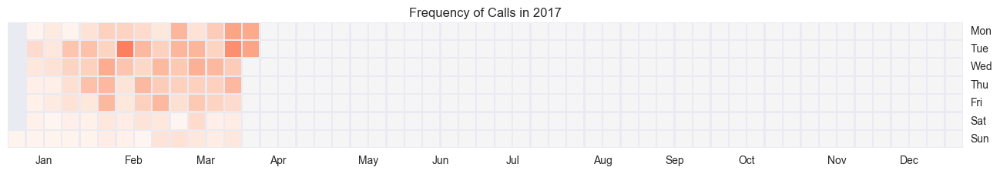

In [142]:
plt.figure(figsize=(16, 12))
calmap.yearplot(frequency_of_calls, year = 2017)
plt.title("Frequency of Calls in 2017")

# General map

In [143]:
m = gmaps.Map()
m.add_layer(gmaps.heatmap_layer(ubicacion_graffiti))
m.add_layer(gmaps.heatmap_layer(ubicacion_sanitation))
m.add_layer(gmaps.heatmap_layer(ubicacion_pothole))
m

______

# Problem 3

# 3.A

#### The idea is to see if the specific "7500 S Wolcott Ave" appear in the databases. By taking its frequency and diving by the total I will have the probability for each data set. 

## Graffiti database probability WOLCOTT AVE

In [144]:
frequency_of_calls_bystreet = graffiti['Street Address'].value_counts()
print(frequency_of_calls_bystreet.iloc[:5])
print(type(frequency_of_calls_bystreet))

5000 N ELSTON AVE         65
2953 W WALTON ST          57
4237 N OB KENNEDY EXPY    55
5111 S PULASKI RD         45
4827 W WILSON AVE         44
Name: Street Address, dtype: int64
<class 'pandas.core.series.Series'>


In [145]:
frequency_of_calls_bystreet.loc['5000 N ELSTON AVE']

65

In [146]:
index=frequency_of_calls_bystreet
for i in index.index:
    if i=='7500 S WOLCOTT AVE':
        print (frequency_of_calls_bystreet.loc[i])

### The dataset does not contain any calls from this adress, therefore the probability is 0

## Pothole database probaility for WOLCOTT AVE

In [147]:
frequency_of_calls_bystreet = pothole['STREET ADDRESS'].value_counts()
print(frequency_of_calls_bystreet.iloc[:5])
print(type(frequency_of_calls_bystreet))

7900 S KEDZIE AVE          80
2858 N LARAMIE AVE         33
7500 S STONY ISLAND AVE    33
1099 W SHERIDAN RD         27
55 W JACKSON BLVD          26
Name: STREET ADDRESS, dtype: int64
<class 'pandas.core.series.Series'>


In [148]:
pothole.head(1)

,CREATION DATE,STATUS,COMPLETION DATE,TYPE OF SERVICE REQUEST,CURRENT ACTIVITY,MOST RECENT ACTION,NUMBER OF POTHOLES FILLED ON BLOCK,STREET ADDRESS,ZIP,location-tuple,time_elapsed
0,2016-03-30,Completed,2016-03-30,Pothole in Street,Final Outcome,Pothole Patched,16.0,3845 N CICERO AVE,60641,"(41.9511231939, -87.7471049909)",0 days


In [149]:
index=frequency_of_calls_bystreet
for i in index.index:
    if i=='7500 S WOLCOTT AVE':
        print (frequency_of_calls_bystreet.loc[i])

1


In [150]:
pothole.shape

(55463, 11)

In [151]:
1/55463

1.8030038043380273e-05

### The dataset does  contain 1 calls from this adress, therefore the probability is 1/55463

## Sanitation database probaility for WOLCOTT AVE

In [152]:
sanitation.head(1)

,Creation Date,Status,Completion Date,Type of Service Request,What is the Nature of this Code Violation?,Street Address,ZIP Code,location-tuple,time_elapsed
0,2016-03-30,Completed,2016-03-30,Sanitation Code Violation,Dog feces in yard,4317 W 47TH ST,60632,"(41.8077690037, -87.7316721811)",0 days


In [153]:
frequency_of_calls_bystreet = sanitation['Street Address'].value_counts()
print(frequency_of_calls_bystreet.iloc[:5])
print(type(frequency_of_calls_bystreet))

4048 N MOZART ST    82
2485 N CLARK ST     49
4352 W 47TH ST      40
4032 N MOZART ST    37
4028 N MOZART ST    29
Name: Street Address, dtype: int64
<class 'pandas.core.series.Series'>


In [154]:
index=frequency_of_calls_bystreet
for i in index.index:
    if i=='7500 S WOLCOTT AVE':
        print (frequency_of_calls_bystreet.loc[i])

1


In [155]:
sanitation.shape

(21443, 9)

In [156]:
1/21443

4.663526558783752e-05

### The dataset does  contain 1 calls from this adress, therefore the probability is 1/21443

## Vacant database probaility for WOLCOTT AVE

In [157]:
vacant.head(1)

,DATE SERVICE REQUEST WAS RECEIVED,"LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).",IS THE BUILDING DANGEROUS OR HAZARDOUS?,IS BUILDING OPEN OR BOARDED?,"IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?",IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?,IS THE BUILDING VACANT DUE TO FIRE?,"ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)",ADDRESS STREET NUMBER,ADDRESS STREET DIRECTION,ADDRESS STREET NAME,ADDRESS STREET SUFFIX,ZIP CODE,location-tuple
0,2016-03-30,Front,nan,Open,FRONT DOOR,Vacant,False,True,5318,S,BISHOP,ST,60609,"(41.7973939805, -87.6610292302)"


In [158]:
vacant.dtypes

DATE SERVICE REQUEST WAS RECEIVED                                        datetime64[ns]
LOCATION OF BUILDING ON THE LOT (IF GARAGE, CHANGE TYPE CODE TO BGD).          category
IS THE BUILDING DANGEROUS OR HAZARDOUS?                                        category
IS BUILDING OPEN OR BOARDED?                                                   category
IF THE BUILDING IS OPEN, WHERE IS THE ENTRY POINT?                             category
IS THE BUILDING CURRENTLY VACANT OR OCCUPIED?                                  category
IS THE BUILDING VACANT DUE TO FIRE?                                            category
ANY PEOPLE USING PROPERTY? (HOMELESS, CHILDEN, GANGS)                          category
ADDRESS STREET NUMBER                                                          category
ADDRESS STREET DIRECTION                                                       category
ADDRESS STREET NAME                                                            category
ADDRESS STREET SUFFIX           

In [159]:
vacant['new_adress'] = vacant["ADDRESS STREET NUMBER"].str.cat(vacant['ADDRESS STREET DIRECTION'], sep= " ")

In [160]:
vacant['new_adress'] = vacant["new_adress"].str.cat(vacant['ADDRESS STREET NAME'], sep= " ")

In [161]:
vacant['new_adress'] = vacant["new_adress"].str.cat(vacant['ADDRESS STREET SUFFIX'], sep= " ")

In [162]:
frequency_of_calls_bystreet = vacant['new_adress'].value_counts()
print(frequency_of_calls_bystreet.iloc[:5])
print(type(frequency_of_calls_bystreet))

7755 S MARYLAND AVE      5
6411 S CHAMPLAIN AVE     5
4160 S WENTWORTH AVE     5
6544 S WINCHESTER AVE    4
6721 S JUSTINE ST        4
Name: new_adress, dtype: int64
<class 'pandas.core.series.Series'>


In [163]:
index=frequency_of_calls_bystreet
for i in index.index:
    if i=='7500 S WOLCOTT AVE':
        print (frequency_of_calls_bystreet.loc[i])

### The dataset does  contain 0 calls from this adress, therefore the probability is 0

The probability of having a call 7500 S WOLCOTT AVE tends to cero. 
We could use other bayesian approached with more sparcing the attributes of the adress and looking for other attribues of the general call, as well with more information. 

# 3.B

In [164]:
graffiti.head(1)

,Creation Date,Status,Completion Date,Type of Service Request,What Type of Surface is the Graffiti on?,Where is the Graffiti located?,Street Address,ZIP Code,location-tuple,time_elapsed
0,2016-03-30,Completed,2016-03-30,Graffiti Removal,Glass,Front,531 N CLARK ST,60654,"(41.8917096984, -87.6309821872)",0 days


In [165]:
frequency_of_calls_byzipcode = graffiti['ZIP Code'].value_counts()
print(frequency_of_calls_byzipcode.iloc[:5])
print(type(frequency_of_calls_bystreet))

60632    13058
60618    10103
60647     9928
60608     8362
60629     7080
Name: ZIP Code, dtype: int64
<class 'pandas.core.series.Series'>


## Just by a simple google search I found that the lawndale and uptown zipcodes are:

## Lawndale Probability

In [166]:
lawndale_zipcodes = [60608, 60623, 60624]

In [167]:
index=frequency_of_calls_byzipcode

for i in index.index:
    if i=='60608':
        f=(frequency_of_calls_byzipcode.loc[i])

for i in index.index:
    if i=='60623':
        o=(frequency_of_calls_byzipcode.loc[i])

for i in index.index:
    if i=='60624':
        p=(frequency_of_calls_byzipcode.loc[i])

In [168]:
probability_lawndale= (f+o+p)/ (graffiti.shape[0])
probability_lawndale

0.11402946281239046

## Uptown Probability

In [169]:
uptown_zipcodes = [60613, 60640]

In [170]:
index=frequency_of_calls_byzipcode

for i in index.index:
    if i=='60613':
        s=(frequency_of_calls_byzipcode.loc[i])

for i in index.index:
    if i=='60640':
        b=(frequency_of_calls_byzipcode.loc[i])


In [171]:
probability_uptown= (s+b)/ (graffiti.shape[0])
probability_uptown

0.044844007831670384

### It is more likerly that they recieve a call from Lawndale

## 3.C

Bayes Rule

$$ P(A \mid B) = \frac{P(B \mid A) \, P(A)}{P(B)} $$

In [172]:
probability_uptown = .4
probability_englewood = .6

probability_graffiti_uptown = .4
probability_graffiti_engelwood = 1/6

probability_graffiti = probability_graffiti_uptown*probability_uptown + probability_graffiti_engelwood*probability_englewood

In [173]:
probability_uptown_graffiti = (probability_graffiti_uptown*probability_uptown) / probability_graffiti
probability_uptown_graffiti

0.6153846153846155

In [174]:
probability_englewood_graffiti = (probability_graffiti_engelwood*probability_englewood) / probability_graffiti
probability_englewood_graffiti

0.3846153846153846

## So the probability of having an uptown call from graffiti  is more likely than having an englewood call from graffiti